## 1. Importações

In [1]:
import cv2
import imutils
import warnings
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage import io, feature, data, exposure

warnings.filterwarnings('ignore')

## 2. Descritores de características

###### 2.1 HOG - Histogram of Oriented Gradients

Histogram of Oriented Gradients (HOG) são descritores de características focados principalmente em detecção de objetos, sendo usados também para a quantificação e representação de formas e texturas. Os parâmetros abaixo do HOG são extremamente importantes pois controlam a dimensionalidade do vetor de características.

Parâmetros da função feature.hog:

    image: Imagem de entrada
    orientations: Número das orientações (bins)
    pixels_per_cell: Tamanho (em pixels) de cada célula
    cells_per_block: Número de células por cada bloco
    transform_sqrt: Normalização da imagem

In [2]:
def show_HOG(ori=8):
    
    # Imagem a ser passada
    global image
    
    # Chamada da função do HOG pelo skimage
    fd, hog_image = feature.hog(image, orientations=ori, pixels_per_cell=(16, 16), cells_per_block=(1, 1), visualize=True, 
                                multichannel=True)
    
    # Re-escala do histograma
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(hog_image_rescaled, cmap='gray')
    ax[1].set_title('HOG')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

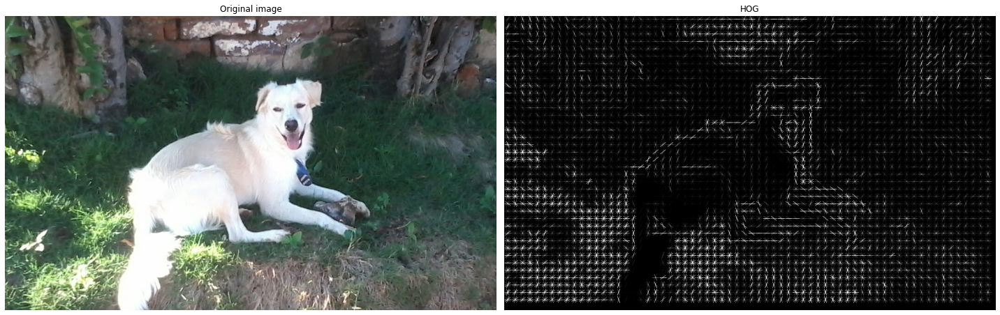

In [3]:
# Carregando a imagem
image = cv2.imread("images/toddy.jpeg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_HOG(5)

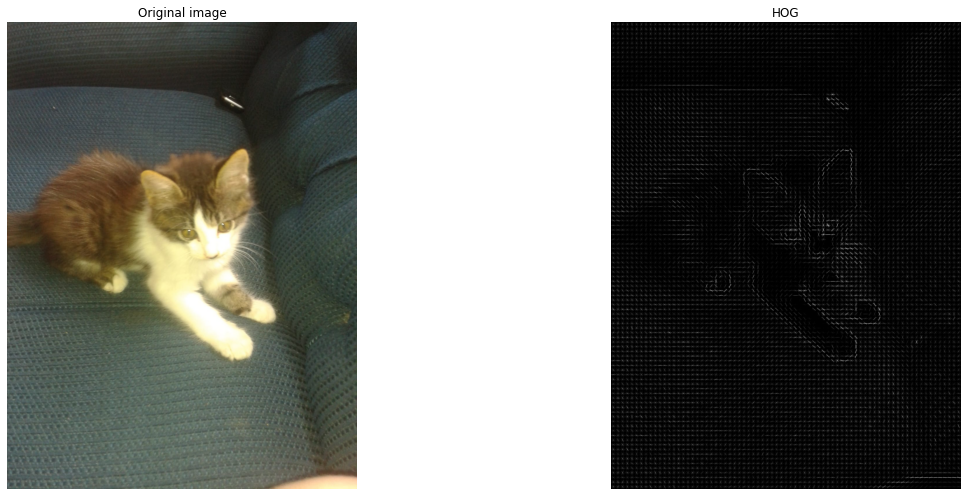

In [4]:
# Carregando a imagem
image = cv2.imread("images/mimi.jpeg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_HOG(5)

###### 2.2 CascadeClassifier



Parâmetros da função cv2.CascadeClassifier.detectMultiScale:

    image: Imagem de entrada
    scalefactor: Aumenta as chances de um rosto menor ser selecionado (faces grandes aumentar, faces menores diminuir)
    minNeighbors: Número minimo de rentagulos que serão gerados (Quanto maior o valor, maior é a certeza do rosto, porém, tende a não detectar todas as faces)
    minSize: Tamanho mínimo do objeto a ser encontrada
    maxSize: Tamanho máximo do objeto a ser encontrada

###### 2.2.1 Facial

In [5]:
def show_facialHaar(scaleFactor=1.09, minNeighbors=3, minSize=(30, 30), maxSize = (100, 100)):
    
    # Imagem a ser passada
    global image
    
    # Chamada da função CascadeClassifier pelo OpenCV com o caminho do arquivo Haar
    detector_facial = cv2.CascadeClassifier('Cascades/haarcascade_frontalface_default.xml')
    
    # RGB > Gray
    imagem_cinza = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Chamada da função detectMultiScale pelo OpenCV
    deteccoes = detector_facial.detectMultiScale(imagem_cinza, scaleFactor = scaleFactor, minNeighbors = minNeighbors,
                                             minSize = minSize, maxSize = maxSize)
    
    # Desenhando as detecções para cada face na imagem
    for (x, y, w, h) in deteccoes:
        # print(f'Tamanho das faces: {w}, {h}')
        cv2.rectangle(image, (x, y), (x + w, y + h), [0, 255, 0], 3)
    
    # Plot do resultado com matplotlib
    plt.figure(figsize = (18, 16))
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    
    print(f'Quantidade de rostos encontrados na imagem: {len(deteccoes)}')
    print(f'Dimensões da Imagem: {str(image.shape[0])} x {str(image.shape[1])}\nCanais RGB: {str(image.shape[2])}')

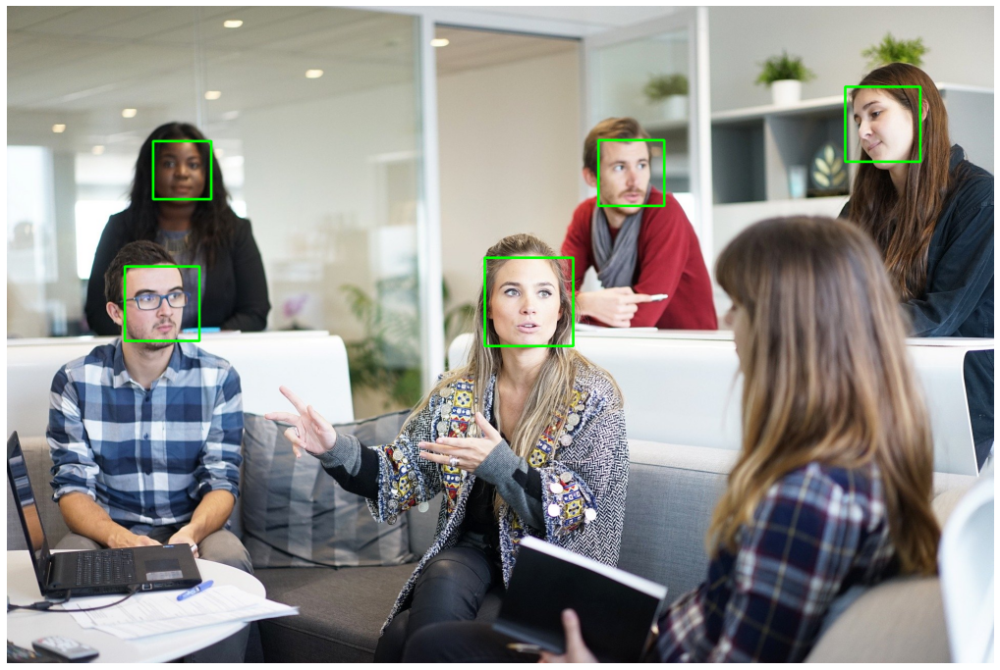

Quantidade de rostos encontrados na imagem: 5
Dimensões da Imagem: 1280 x 1920
Canais RGB: 3


In [6]:
# Carregando a imagem
image = cv2.imread("images/people1.jpg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_facialHaar(scaleFactor=1.09, minNeighbors=15, minSize=None, maxSize=None)

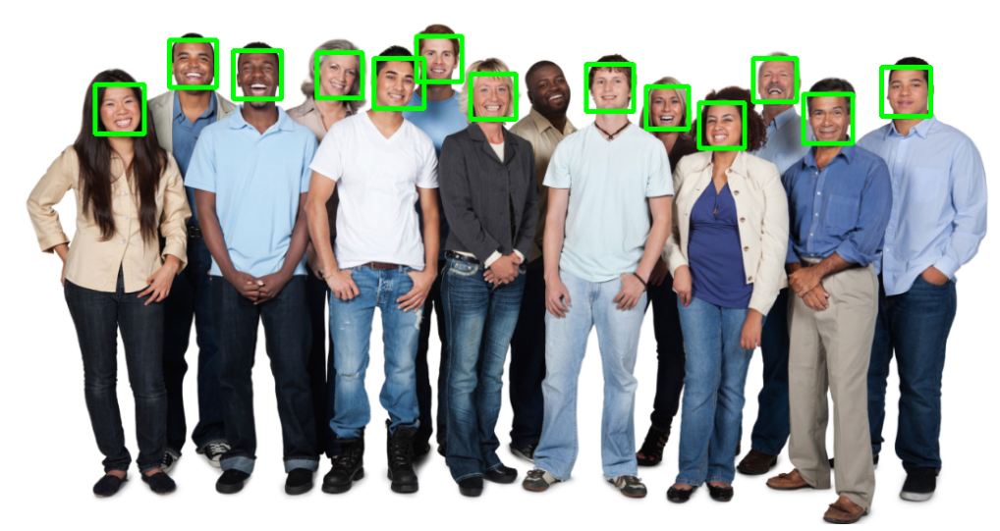

Quantidade de rostos encontrados na imagem: 13
Dimensões da Imagem: 537 x 1023
Canais RGB: 3


In [7]:
# Carregando a imagem
image = cv2.imread("images/people2.jpg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_facialHaar(scaleFactor = 1.2, minNeighbors = 3, minSize = (32, 32), maxSize = (100, 100))

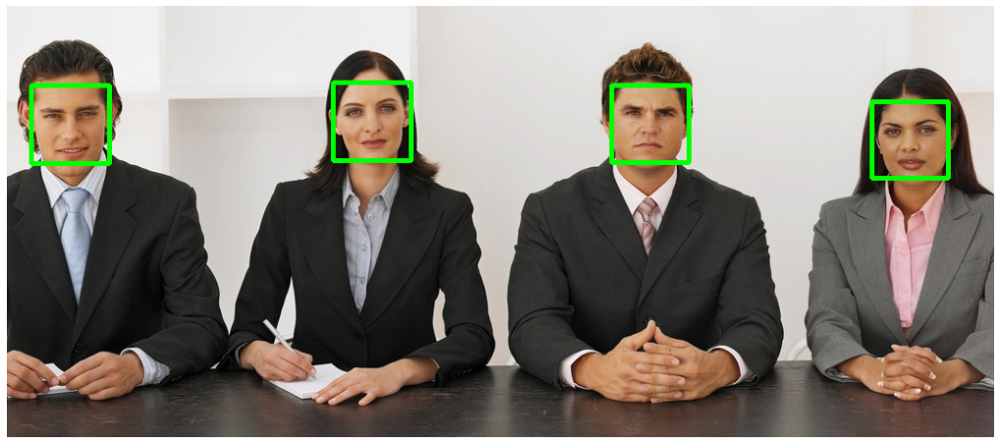

Quantidade de rostos encontrados na imagem: 4
Dimensões da Imagem: 447 x 1024
Canais RGB: 3


In [8]:
# Carregando a imagem
image = cv2.imread("images/people4.jpg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_facialHaar(scaleFactor = 1.2, minNeighbors = 5, minSize = (32, 32), maxSize = (100, 100))

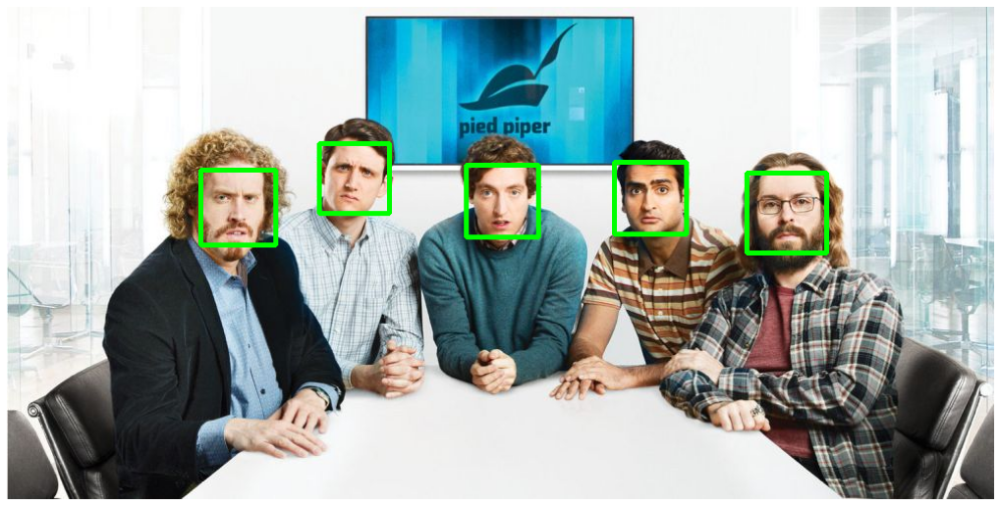

Quantidade de rostos encontrados na imagem: 5
Dimensões da Imagem: 500 x 1000
Canais RGB: 3


In [9]:
# Carregando a imagem
image = cv2.imread("images/people5.jpg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_facialHaar(scaleFactor = 1.2, minNeighbors = 5, minSize = (32, 32), maxSize = (100, 100))

###### 2.2.2 Facial & Eyes

In [10]:
def show_facialEyes(scaleFactor=1.09, minNeighbors=3, minSize=(30, 30), maxSize = (100, 100)):
    
    # Imagem a ser passada
    global image
    
    # Chamada da função CascadeClassifier pelo OpenCV com o caminho do arquivo Haar
    detector_facial = cv2.CascadeClassifier('Cascades/haarcascade_frontalface_default.xml')
    detector_olhos = cv2.CascadeClassifier('Cascades/haarcascade_eye.xml')
    
    # RGB > Gray
    imagem_cinza = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Chamada da função detectMultiScale pelo OpenCV para detecção da face
    deteccoes = detector_facial.detectMultiScale(imagem_cinza, scaleFactor = scaleFactor, minNeighbors = minNeighbors,
                                             minSize = minSize, maxSize = maxSize)
    
    # Desenhando as detecções para cada face na imagem
    for (x, y, w, h) in deteccoes:
        # print(f'Tamanho das faces: {w}, {h}')
        cv2.rectangle(image, (x, y), (x + w, y + h), [0, 255, 0], 3)
    
    # Chamada da função detectMultiScale pelo OpenCV para detecção dos olhos
    deteccoes_olhos = detector_olhos.detectMultiScale(imagem_cinza, scaleFactor=1.09, minNeighbors=9, maxSize=(70,70))
    
    for (x, y, w, h) in deteccoes_olhos:
        # print(f'Tamanho dos olhos detectados: {w}, {h}')
        cv2.rectangle(image, (x, y), (x + w, y + h), [255, 0, 0], 2)
    
    # Plot do resultado com matplotlib
    plt.figure(figsize = (18, 16))
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    
    print(f'Quantidade de rostos encontrados na imagem: {len(deteccoes)}')
    print(f'Dimensões da Imagem: {str(image.shape[0])} x {str(image.shape[1])}\nCanais RGB: {str(image.shape[2])}')

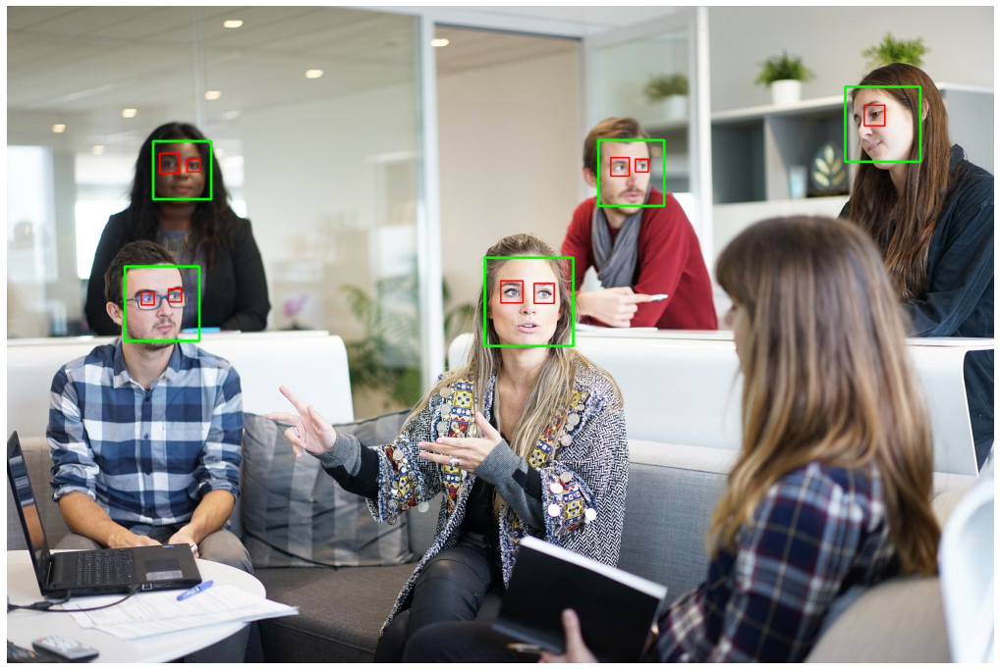

Quantidade de rostos encontrados na imagem: 5
Dimensões da Imagem: 1280 x 1920
Canais RGB: 3


In [11]:
# Carregando a imagem
image = cv2.imread("images/people1.jpg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_facialEyes(scaleFactor=1.09, minNeighbors=15, minSize=None, maxSize=None)

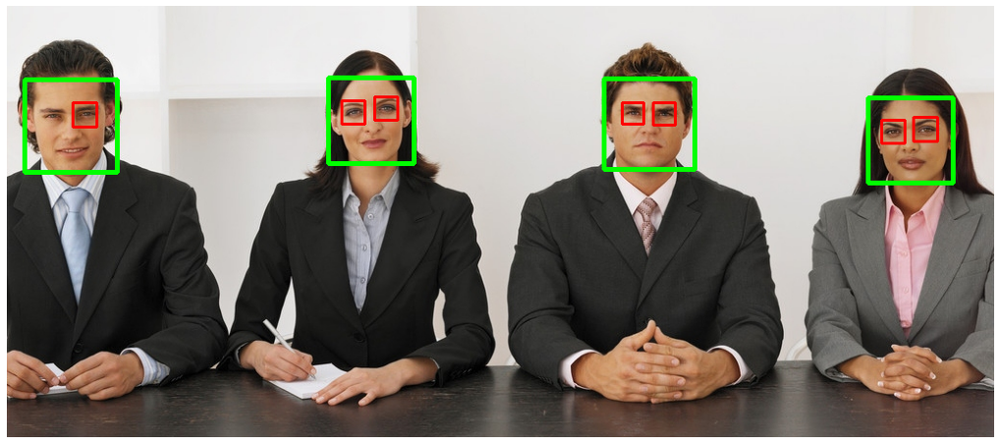

Quantidade de rostos encontrados na imagem: 4
Dimensões da Imagem: 447 x 1024
Canais RGB: 3


In [12]:
# Carregando a imagem
image = cv2.imread("images/people4.jpg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_facialEyes(scaleFactor=1.09, minNeighbors=15, minSize=None, maxSize=None)

###### 2.2.3 Vehicles

In [13]:
def show_vehiclesHaar(scaleFactor=1.09, minNeighbors=3, minSize=(30, 30), maxSize = (100, 100)):
    
    # Imagem a ser passada
    global image
    
    # Chamada da função CascadeClassifier pelo OpenCV com o caminho do arquivo Haar
    detector_veiculos = cv2.CascadeClassifier('Cascades/cars.xml')
    
    # RGB > Gray
    imagem_cinza = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Chamada da função detectMultiScale pelo OpenCV
    deteccoes = detector_veiculos.detectMultiScale(imagem_cinza, scaleFactor = scaleFactor, minNeighbors = minNeighbors,
                                             minSize = minSize, maxSize = maxSize)
    
    # Desenhando as detecções para cada veiculo na imagem
    for (x, y, w, h) in deteccoes:
        # print(f'Tamanho dos veiculos: {w}, {h}')
        cv2.rectangle(image, (x, y), (x + w, y + h), [0, 255, 0], 1)
    
    # Plot do resultado com matplotlib
    plt.figure(figsize = (18, 16))
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    
    print(f'Quantidade de veiculos encontrados na imagem: {len(deteccoes)}')
    print(f'Dimensões da Imagem: {str(image.shape[0])} x {str(image.shape[1])}\nCanais RGB: {str(image.shape[2])}')

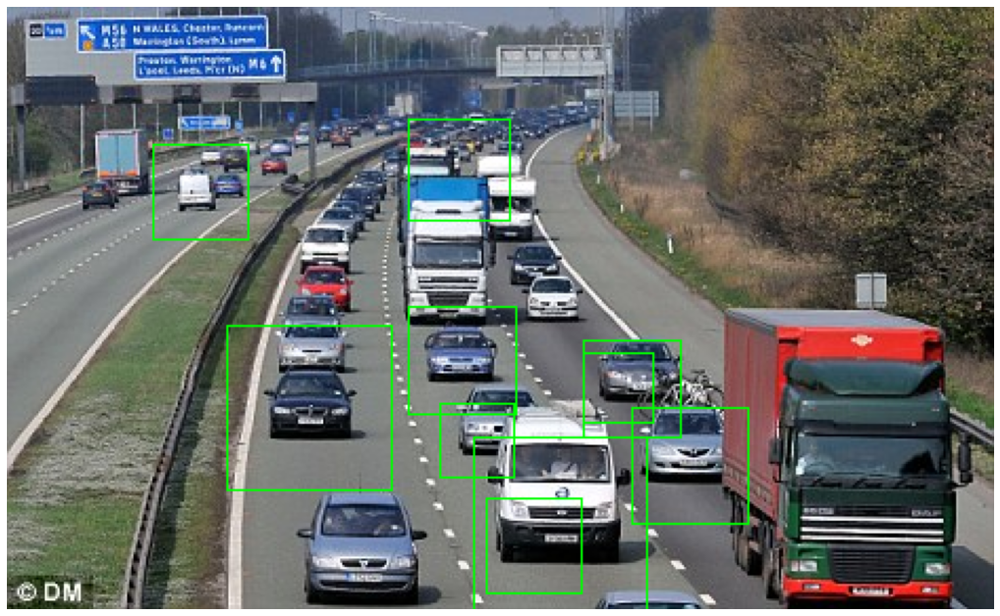

Quantidade de veiculos encontrados na imagem: 10
Dimensões da Imagem: 286 x 468
Canais RGB: 3


In [14]:
# Carregando a imagem
image = cv2.imread("images/car.jpg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_vehiclesHaar(scaleFactor = 1.07, minNeighbors =1, minSize = (10, 10),  maxSize = (200, 200))

###### 2.2.4 Clocks

In [15]:
def show_clocksHaar(scaleFactor=1.01, minNeighbors = 3, minSize = (75, 75), maxSize = (200, 200)):

    # Imagem a ser passada
    global image
    
    # Chamada da função CascadeClassifier pelo OpenCV com o caminho do arquivo Haar
    detector_relogios = cv2.CascadeClassifier('Cascades/clocks.xml')
    
    # RGB > Gray
    imagem_cinza = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Chamada da função detectMultiScale pelo OpenCV
    deteccoes = detector_relogios.detectMultiScale(imagem_cinza, scaleFactor = scaleFactor, minNeighbors = minNeighbors,
                                             minSize = minSize, maxSize = maxSize)
    
    # Desenhando as detecções para cada veiculo na imagem
    for (x, y, w, h) in deteccoes:
        # print(f'Tamanho dos relogios: {w}, {h}')
        cv2.rectangle(image, (x, y), (x + w, y + h), [0, 255, 0], 3)
    
    # Plot do resultado com matplotlib
    plt.figure(figsize = (18, 16))
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    
    print(f'Quantidade de relogios encontrados na imagem: {len(deteccoes)}')
    print(f'Dimensões da Imagem: {str(image.shape[0])} x {str(image.shape[1])}\nCanais RGB: {str(image.shape[2])}')

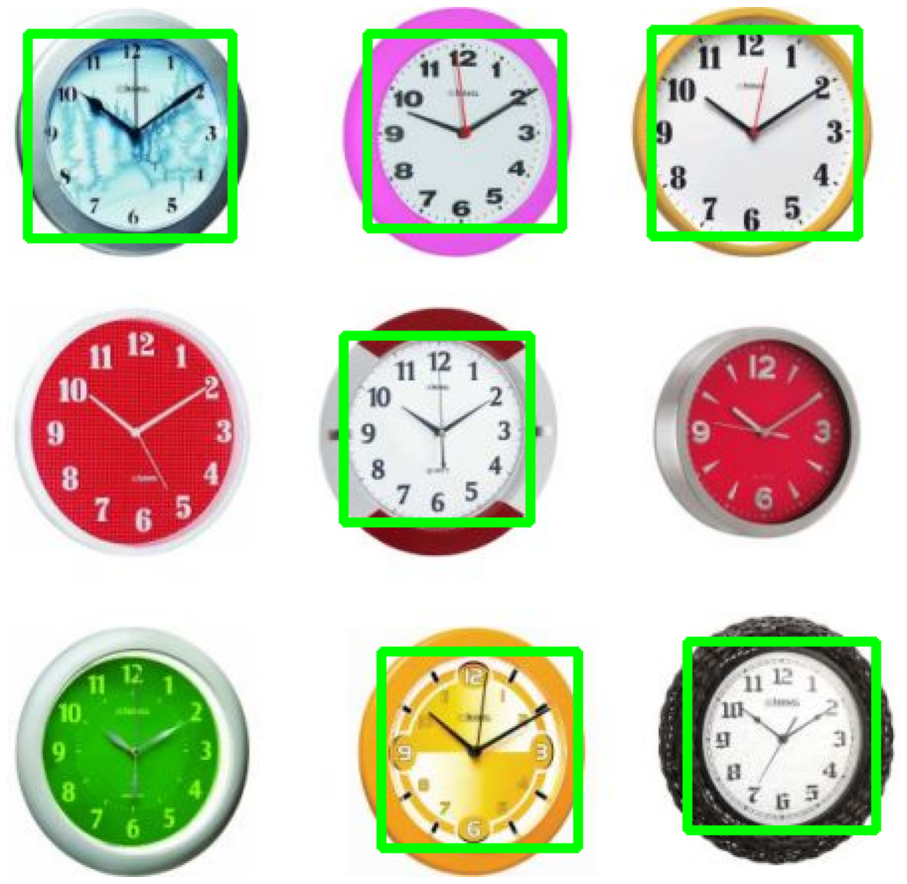

Quantidade de relogios encontrados na imagem: 6
Dimensões da Imagem: 438 x 450
Canais RGB: 3


In [16]:
# Carregando a imagem
image = cv2.imread("images/clock.jpg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_clocksHaar()

###### 2.1.5 Full-Body

In [17]:
def show_fullbodyHaar(scaleFactor=1.09, minNeighbors=3, minSize=(30, 30), maxSize = (100, 100)):
    
    # Imagem a ser passada
    global image
    
    # Chamada da função CascadeClassifier pelo OpenCV com o caminho do arquivo Haar
    detector_corpo = cv2.CascadeClassifier('Cascades/fullbody.xml')
    
    # RGB > Gray
    imagem_cinza = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Chamada da função detectMultiScale pelo OpenCV
    deteccoes = detector_corpo.detectMultiScale(imagem_cinza, scaleFactor = scaleFactor, minNeighbors = minNeighbors,
                                             minSize = minSize, maxSize = maxSize)
    
    # Desenhando as detecções para cada veiculo na imagem
    for (x, y, w, h) in deteccoes:
        # print(f'Tamanho das pessoas: {w}, {h}')
        cv2.rectangle(image, (x, y), (x + w, y + h), [0, 255, 0], 1)
    
    # Plot do resultado com matplotlib
    plt.figure(figsize = (18, 16))
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    
    print(f'Quantidade de pessoas encontrados na imagem: {len(deteccoes)}')
    print(f'Dimensões da Imagem: {str(image.shape[0])} x {str(image.shape[1])}\nCanais RGB: {str(image.shape[2])}')

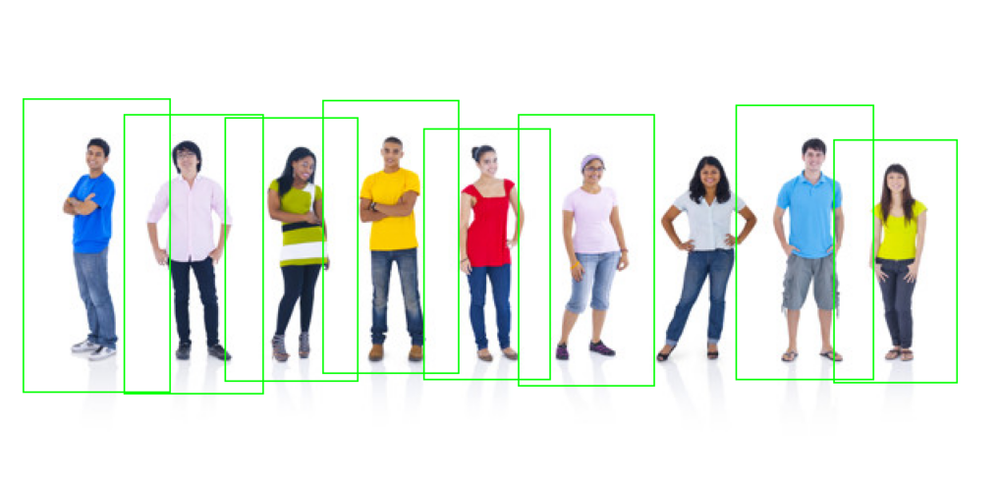

Quantidade de pessoas encontrados na imagem: 8
Dimensões da Imagem: 294 x 626
Canais RGB: 3


In [18]:
# Carregando a imagem
image = cv2.imread("images/people3.jpg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_fullbodyHaar(scaleFactor = 1.04, minNeighbors = 3, minSize = (75, 75), maxSize = (200, 200))

###### 2.3 Harris Corner

Harris Corner tem como foco principal identificar cantos em uma determinada imagem, estes cantos geralmente possuem regiões com grandes variações de intensidade dos gradientes.

Parâmetros da função cv2.cornerHarris:

    src: Imagem de entrada
    blockSize: Tamanho dos blocos da vizinhança
    ksize: Parâmetro do operador Sobel
    k: Parâmetro de abertura para o operador Sobe.

In [19]:
def show_Harris(bs=4, ks=5, k=0.04):
    
    # Imagem a ser passada
    global image
    
    # Cópia da imagem original
    image_corner = image.copy()
    
    # BGR > GRAY
    gray = cv2.cvtColor(image_corner, cv2.COLOR_BGR2GRAY)
    
    # Conversão float32
    gray = np.float32(gray)
    
    # Chamada da função cornerHarris pelo OpenCV
    corners = cv2.cornerHarris(gray, blockSize=bs, ksize=ks, k=k)

    # Dilatação
    corners = cv2.dilate(corners, None)

    # Limiar para a detecção (cor: Red G B)
    image_corner[corners > 0.01 * corners.max()] = [255, 0, 0]

    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(image_corner)
    ax[1].set_title('Harris Corner')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

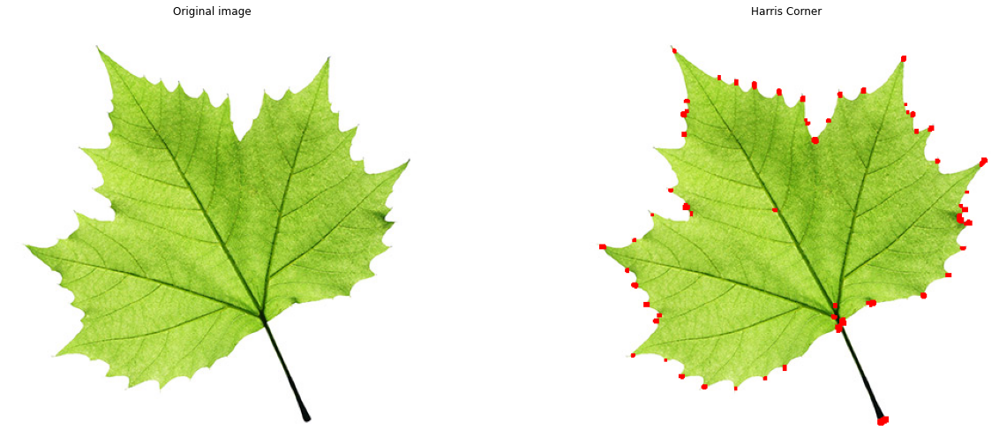

In [20]:
# Carregando a imagem
image = cv2.imread("images/folha.jpg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_Harris()

###### 2.4 GFTT

GFTT (Good Features to Track Detector) é uma modificação do detector Harris Corner que utiliza uma função que melhora a qualidade geral dos contornos detectados.

Parâmetros da função cv2.goodFeaturesToTrack:

    src: Imagem de entrada
    maxCorners: Número máximo dos cantos a serem retornados
    qualityLevel: Qualidade mínima a ser aceita dos cantos na imagem.
    minDistance: Distância euclidiana mínima possível entre os cantos retornados.

In [21]:
def show_GFTT(mc=7, ql=0.05, md=15):
    
    # Imagem a ser passada
    global image
    
    # Cópia da imagem original
    image_corner = image.copy()
    
    # BGR > GRAY
    gray = cv2.cvtColor(image_corner, cv2.COLOR_BGR2GRAY)
    
    # Chamada da função goodFeaturesToTrack pelo OpenCV
    corners = cv2.goodFeaturesToTrack(image=gray, maxCorners=mc, qualityLevel=ql, minDistance=25)
    
    # Conversão float32
    gray = np.float32(gray)

    # Marca os contornos detectados
    for item in corners:
        x, y = item[0]
        cv2.circle(image_corner, (int(x), int(y)), 4, [0, 0, 255], 3)

    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 7), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(image_corner)
    ax[1].set_title('GFTT')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

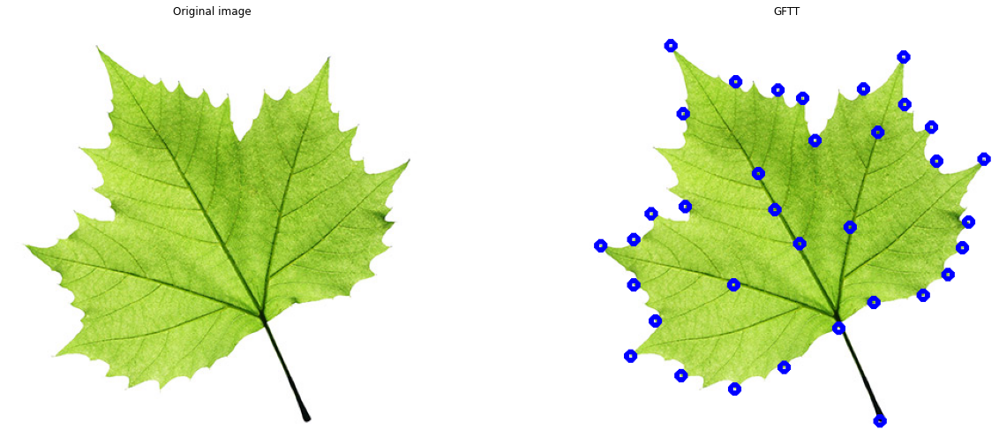

In [22]:
# Carregando a imagem
image = cv2.imread("images/folha.jpg")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_GFTT(mc=35)

###### 2.5 SIFT

SIFT (Scale Invariant Feature Transform) realiza a extração dos pontos-chaves e criar descritores de caracteristicas independentes, realiza uma construção de uma 'pirâmide' ao diminuir uma imagem e calcula as diferenças gaussianas.

Parâmetros da função cv2.drawKeypoints:

    image: Imagem de entrada
    keypoints: Keypoints da imagem original (detectados pelo SIFT)
    outImage: Imagem de saida (Conteúdo depende das flags)
    flags: Flags para o desenho das features.

In [23]:
def show_SIFT():
    
    # Imagem a ser passada
    global image
    
    # BGR > GRAY
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Detector de recursos SIFT
    sift = cv2.xfeatures2d.SIFT_create()
    keypoints = sift.detect(gray_image, None)
    
    # Chamada da função drawKeypoints pelo OpenCV
    input_image = cv2.drawKeypoints(image, keypoints, gray_image, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 12), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(input_image)
    ax[1].set_title('SIFT')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

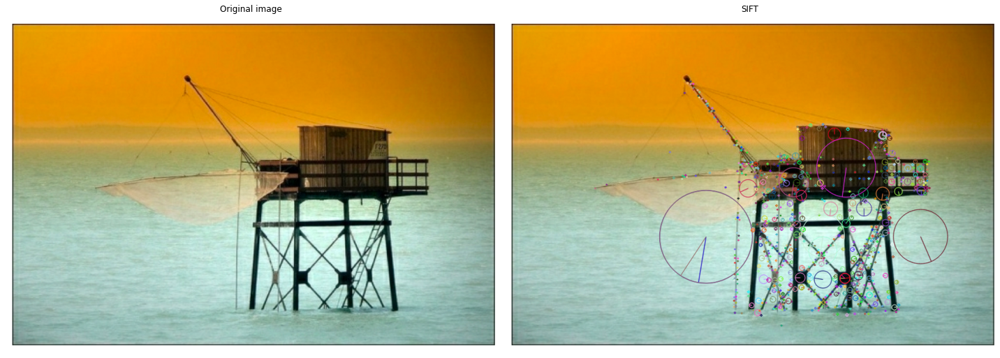

In [24]:
# Carregando a imagem
image = cv2.imread("images/pesquero.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_SIFT()

###### 2.6 SURF

O SIFT é considerado computacionalmente intensivo e considerado lento. Para resolver o custo computacional do SIFT, o SURF utiliza filtros de caixa simples para aproximação gaussiana. Atualmente o algoritmo é patenteado e não está dispobiliizado gratuitamente para uso comercial (Há uma forma de rodar, mas acabei não conseguindo :/)

Parâmetros da função cv2.drawKeypoints:

    image: Imagem de entrada
    keypoints: Keypoints da imagem original (detectados pelo SURF)
    outImage: Imagem de saida (Conteúdo depende das flags)
    flags: Flags para o desenho das features.

In [25]:
def show_SURF():
    
    # Imagem a ser passada
    global image
    
    # BGR > GRAY
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Detector de recursos SURF
    surf = cv2.xfeatures2d.SURF_create(400)
    
    # Computando os keypoints
    keypoints, _ = surf.detectAndCompute(gray, None)
    
    # Chamada da função drawKeypoints pelo OpenCV
    input_image = cv2.drawKeypoints(image, keypoints, None, [0, 255, 0], 4)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 12), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(input_image)
    ax[1].set_title('SURF')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

In [26]:
# Carregando a imagem
image = cv2.imread("images/pesquero.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_SURF()

error: OpenCV(4.5.4) D:\a\opencv-python\opencv-python\opencv_contrib\modules\xfeatures2d\src\surf.cpp:1029: error: (-213:The function/feature is not implemented) This algorithm is patented and is excluded in this configuration; Set OPENCV_ENABLE_NONFREE CMake option and rebuild the library in function 'cv::xfeatures2d::SURF::create'


###### 2.7 FAST

Pensando em sistemas em tempo real tanto o SIFT quanto o SURF não possuem um bom processamento computacional. Com isso em mente, foi criado o FAST que como o nome já diz, funciona de uma bem mais veloz em comparação aos anteriores porém, o FAST é um algoritmo apenas para detecção de pontos-chave, após serem detectados ainda é necessário utilizar o SIFT ou SURF para computar os descritores.


Parâmetros da função cv2.drawKeypoints:

    image: Imagem de entrada
    keypoints: Keypoints da imagem original (detectados pelo FAST)
    outImage: Imagem de saida (Conteúdo depende das flags)
    flags: Flags para o desenho das features.

In [27]:
def show_FAST():
    
    # Imagem a ser passada
    global image
    
    # BGR > GRAY
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Detector de recursos FAST
    fast = cv2.FastFeatureDetector_create()
    
    # Computando os keypoints
    keypoints = fast.detect(gray_image)
    
    # Chamada da função drawKeypoints pelo OpenCV
    input_image = cv2.drawKeypoints(image, keypoints, None, [0, 255, 0], 4)
    
    # Loop pelos keypoints para o desenho dos resultados
    for kp in keypoints:
        r = int(0.5 * kp.size)
        (x, y) = np.int0(kp.pt)
        cv2.circle(input_image, (x, y), r, [0, 255, 0], 2)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 12), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(input_image)
    ax[1].set_title('FAST')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

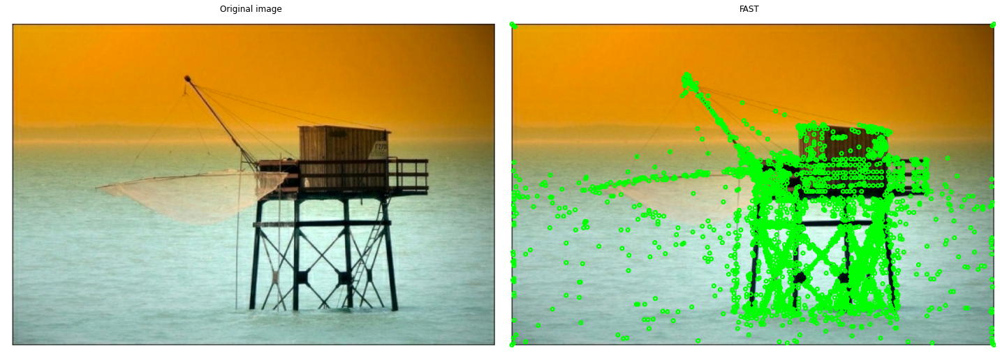

In [28]:
# Carregando a imagem
image = cv2.imread("images/pesquero.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_FAST()

###### 2.8 BRISK

BRISK também é um detector de ponto-chaves que é uma extensão do FAST e busca abordar o problema que ele possui, a invariância de espaço de escala. De forma resumida, o processo geral dele é reduzir pela metade do tamanho da imagem em cada camada da pirâmide gerada.

Parâmetros da função cv2.drawKeypoints:

    image: Imagem de entrada
    keypoints: Keypoints da imagem original (detectados pelo BRISK)
    outImage: Imagem de saida (Conteúdo depende das flags)
    flags: Flags para o desenho das features..

In [29]:
def show_BRISK():
    
    # Imagem a ser passada
    global image
    
    # Cópia da imagem original
    input_image = image.copy()

    # BGR > Gray
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Detector de recursos BRISK
    brisk = cv2.BRISK_create()
    
    # Computando os keypoints
    keypoints = brisk.detect(gray_image)
    
    # Loop pelos keypoints para o desenho dos resultados
    for kp in keypoints:
        r = int(0.5 * kp.size)
        (x, y) = np.int0(kp.pt)
        cv2.circle(input_image, (x, y), r, [255, 0, 0], 1)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 12), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(input_image)
    ax[1].set_title('BRISK')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

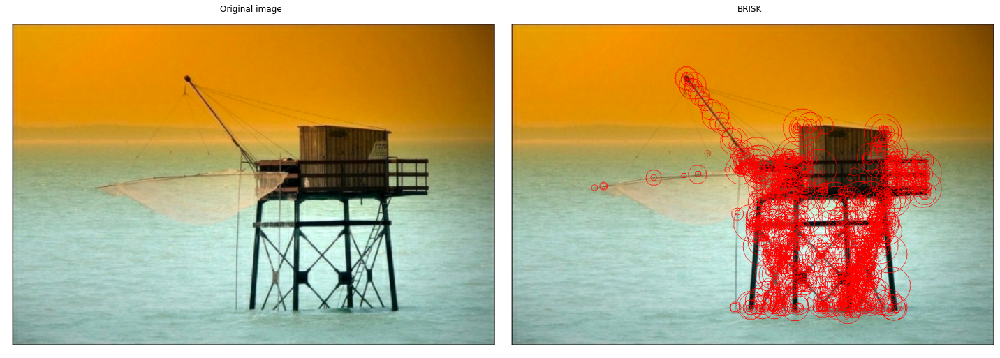

In [30]:
# Carregando a imagem
image = cv2.imread("images/pesquero.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_BRISK()

###### 2.9 ORB

O ORB também uma extensão do FAST porém, ao contrário do BRISK o ORB adiciona invariância de rotação.

Parâmetros da função cv2.drawKeypoints:

    image: Imagem de entrada
    keypoints: Keypoints da imagem original (detectados pelo ORB)
    outImage: Imagem de saida (Conteúdo depende das flags)
    flags: Flags para o desenho das features.

In [31]:
def show_ORB():
    
    # Imagem a ser passada
    global image
    
    # Cópia da imagem original
    input_image = image.copy()

    # BGR > Gray
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Detector de recursos ORB
    orb = cv2.ORB_create()
    
    # Computando os keypoints
    keypoints = orb.detect(gray_image, None)
    
    # Calcula keypoints e descritores
    keypoints, descriptors = orb.compute(gray_image, keypoints)
    
    # Desenha os keypoints na imagem
    final_keypoints = cv2.drawKeypoints(input_image, keypoints, gray_image, color=[255, 0, 255], flags=0)
    
    # Plot do resultado com matplotlib
    fig, axes = plt.subplots(nrows = 1,ncols=2, figsize=(20, 12), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image)
    ax[0].set_title('Original image')

    ax[1].imshow(final_keypoints)
    ax[1].set_title('ORB')

    for a in ax:
        a.axis('off')

    fig.tight_layout()
    plt.show()

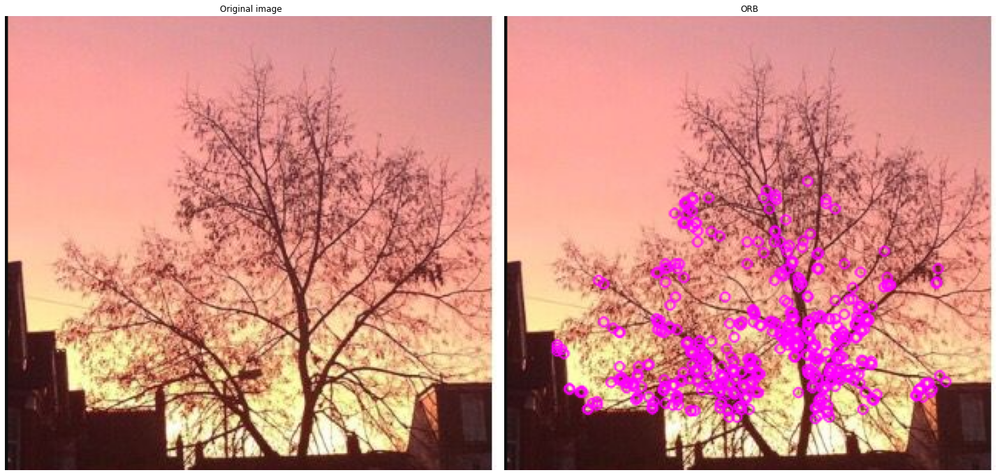

In [32]:
# Carregando a imagem
image = cv2.imread("images/tree1.png")

# BGR > RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

show_ORB()

###### 2.10 Feature Matching com o ORB

In [33]:
def draw_matches(img1, keypoints1, img2, keypoints2, matches):
    
    rows1, cols1 = img1.shape[:2]
    rows2, cols2 = img2.shape[:2]

    # Criação de uma nova imagem concetando as duas imagens juntas
    output_img = np.zeros((max([rows1, rows2]), cols1 + cols2, 3), dtype='uint8')
    output_img[:rows1, :cols1, :] = np.dstack([img1, img1, img1])
    output_img[:rows2, cols1:cols1 + cols2, :] = np.dstack([img2, img2, img2])

    # Linhas das conexões dos pontos-chave
    for match in matches:
        
        # Pontos-chaves obtidos de cada imagem
        img1_idx = match.queryIdx
        img2_idx = match.trainIdx

        (x1, y1) = keypoints1[img1_idx].pt
        (x2, y2) = keypoints2[img2_idx].pt

        radius = 4
        colour = [0, 255, 0]
        thickness = 1
        
        # Desenho dos círculos das coordenadas
        cv2.circle(output_img, (int(x1), int(y1)), radius, colour, thickness)
        cv2.circle(output_img, (int(x2) + cols1, int(y2)), radius, colour, thickness)
        
        # Desenho da linha das conexões
        cv2.line(output_img, (int(x1), int(y1)), (int(x2) + cols1, int(y2)), colour, thickness)

    return output_img


def show_FeatureMatching():
    
    # Imagens a serem passadas
    global image1
    global image2
    
    # BGR > Gray
    gray_image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray_image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
    
    # Detector de recursos ORB
    orb = cv2.ORB_create()
    
    # Computando os keypoints
    keypoints1 = orb.detect(gray_image1, None)
    keypoints2 = orb.detect(gray_image2, None)
    
    # Calcula keypoints e descritores
    keypoints1, descriptors1 = orb.compute(gray_image1, keypoints1)
    keypoints2, descriptors2 = orb.compute(gray_image2, keypoints2) 
    
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    
    # Match descriptors
    matches = bf.match(descriptors1, descriptors2)

    # Classifica na ordem de sua distância
    matches = sorted(matches, key=lambda x: x.distance)
    
    # Desenha as primeiras 'n' matches
    output = draw_matches(gray_image1, keypoints1, gray_image2, keypoints2, matches[:30])
    
    # output = cv2.cvtColor(image2, cv2.COLOR_GRAY2RGB)
        
    # Plot do resultado com matplotlib
    plt.figure(figsize = (20, 12))
    plt.imshow(output)
    plt.axis('off')
    plt.show()

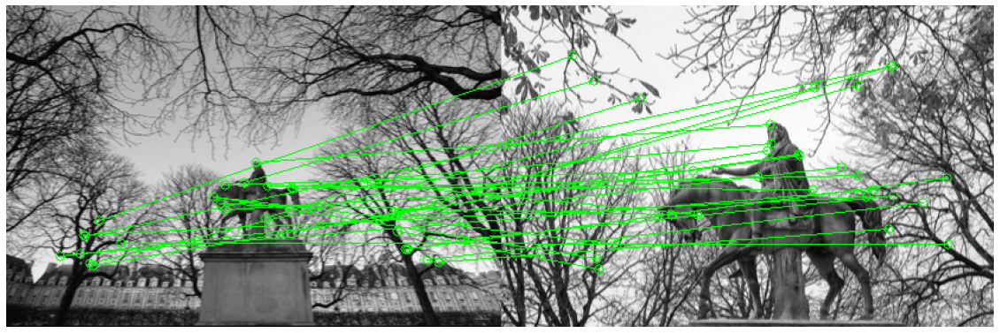

In [34]:
# Carregando a imagem
image1 = cv2.imread('images/statue1.png')
image2 = cv2.imread('images/statue2.png')

show_FeatureMatching()

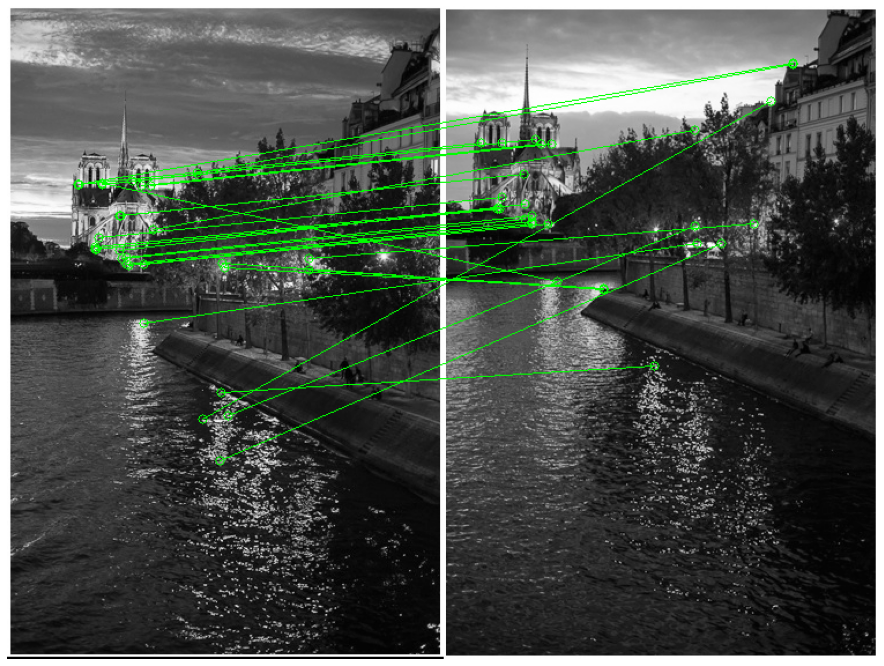

In [35]:
# Carregando a imagem
image1 = cv2.imread('images/city1.png')
image2 = cv2.imread('images/city2.png')

show_FeatureMatching()

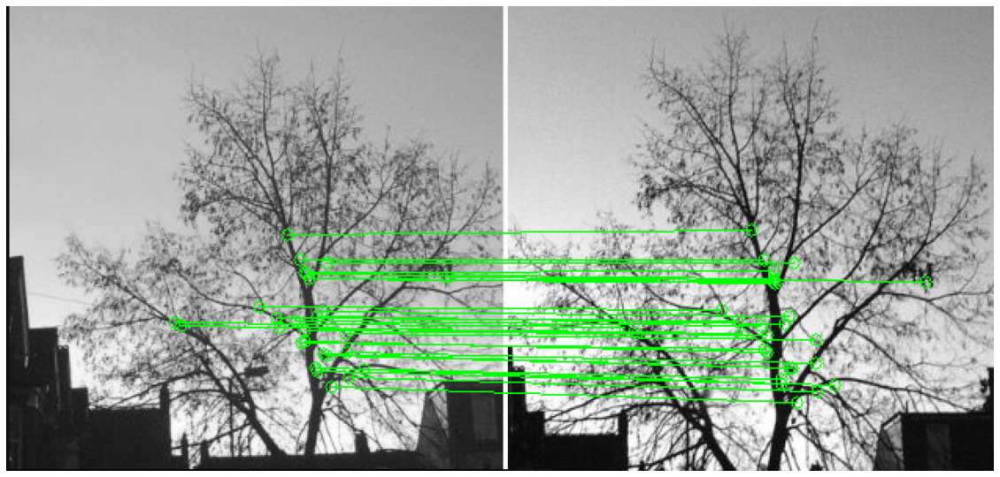

In [36]:
# Carregando a imagem
image1 = cv2.imread('images/tree1.png')
image2 = cv2.imread('images/tree2.png')

show_FeatureMatching()

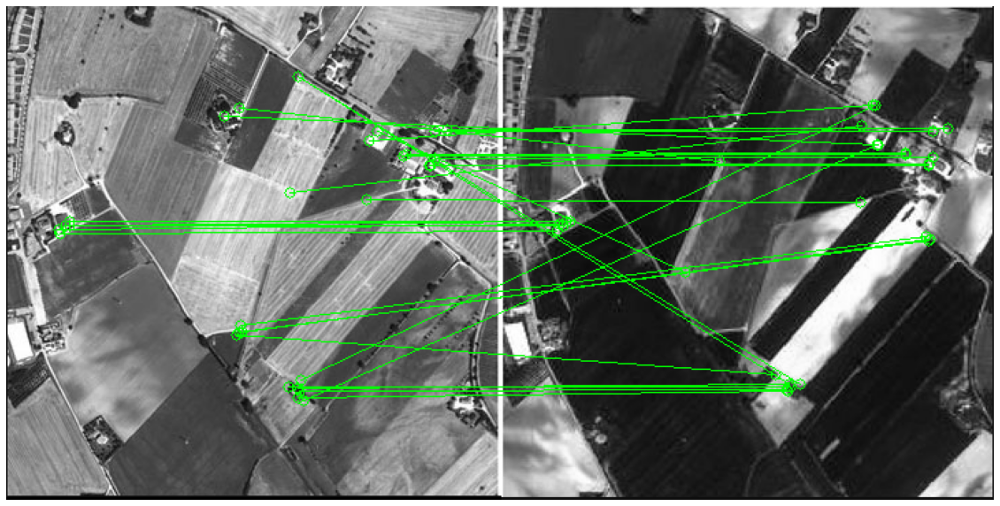

In [37]:
# Carregando a imagem
image1 = cv2.imread('images/satelite1.png')
image2 = cv2.imread('images/satelite2.png')

show_FeatureMatching()

## 3. Referências

HOG: 

- https://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html


- https://customers.pyimagesearch.com/lesson-sample-histogram-of-oriented-gradients-and-car-logo-recognition/


- https://www.youtube.com/watch?v=JpoMJOm-I_0&list=PLmDIGfkfgKy1SBjXA0kBk4DAhIaN1vQOS&index=9&ab_channel=AldovonWangenheim

Haarcascade:

- https://www.youtube.com/watch?v=JpoMJOm-I_0&list=PLmDIGfkfgKy1SBjXA0kBk4DAhIaN1vQOS&index=9&ab_channel=AldovonWangenheim


- https://docs.opencv.org/3.4/db/d28/tutorial_cascade_classifier.html


- https://docs.opencv.org/3.4/d1/de5/classcv_1_1CascadeClassifier.html


- https://www.udemy.com/course/visao-computacional-o-guia-completo/

Detecção de cantos (Harris, GFTT, SIFT, FAST, SURF & ORB:):

- https://docs.opencv.org/4.x/dc/d0d/tutorial_py_features_harris.html


- https://theailearner.com/tag/cv2-goodfeaturestotrack/


- https://www.youtube.com/watch?v=Ny9VCa4IBlU&list=PLmDIGfkfgKy1SBjXA0kBk4DAhIaN1vQOS&index=10&ab_channel=AldovonWangenheim


- https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html


- https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_fast/py_fast.html


- https://docs.opencv.org/3.3.0/df/dd2/tutorial_py_surf_intro.html


- https://docs.opencv.org/3.3.0/d1/d89/tutorial_py_orb.html